In [1]:
import pandas as pd # dataframe manipulation
import numpy as np # linear algebra

# data visualization
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap

# sklearn 
from sklearn.cluster import KMeans
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report

from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer

import lightgbm as lgb
import prince

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


Useful funtions

In [2]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["component-1", "component-2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["component-1", "component-2", "component-3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()

    fig = px.scatter_3d(df, 
                        x=columns[0], 
                        y=columns[1], 
                        z=columns[2],
                        color='cluster',
                        template="plotly",
                        
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 4,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 1000, 
                                height = 800, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            zaxis=dict(title = 'component-3', titlefont_color = 'black')),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                      
    
    fig.show()


def plot_pca_2d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    columns = df.columns[0:3].tolist()


    fig = px.scatter(df, 
                        x=columns[0], 
                        y=columns[1],
                        color='cluster',
                        template="plotly",
                        # symbol = "cluster",
                        
                        color_discrete_sequence=px.colors.qualitative.Vivid,
                        title=title).update_traces(
                            # mode = 'markers',
                            marker={
                                "size": 8,
                                "opacity": opacity,
                                # "symbol" : "diamond",
                                "line": {
                                    "width": width_line,
                                    "color": "black",
                                }
                            }
                        ).update_layout(
                                width = 800, 
                                height = 700, 
                                autosize = False, 
                                showlegend = True,
                                legend=dict(title_font_family="Times New Roman",
                                            font=dict(size= 20)),
                                scene = dict(xaxis=dict(title = 'component-1', titlefont_color = 'black'),
                                            yaxis=dict(title = 'component-2', titlefont_color = 'black'),
                                            ),
                                font = dict(family = "Gilroy", color  = 'black', size = 15))
                        
        
    fig.show()


Get Data

In [3]:
df = pd.read_csv("data/train.csv", sep = ";")
df


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [4]:
import pandas as pd  # dataframe manipulation
import numpy as np  # linear algebra
from sentence_transformers import SentenceTransformer
from dice_embeddings import DICE

dice = DICE(d = 20, min_bound=-10000, max_bound=150000, norm="l2")
df = pd.read_csv("data/train.csv", sep=";")

# from dice_embeddings import DICE
# import pandas as pd

# dice = DICE()

def get_numeric_embedding(x):
    
    embeddings = []
    
    for val in x:
        out = dice.make_dice(val)   
        embeddings.append(list(out))

    # make flat list
    embeddings = [item for sublist in embeddings for item in sublist]
    return embeddings


# def get_numeric_embedding(x):
    
#     embeddings = []
    
#     for val in x:
#         out = dice.make_dice(val)   
#         embeddings.append(list(out))

#     # make flat list
#     embeddings = [item for sublist in embeddings for item in sublist]
#     return embeddings
def compile_text(x):
    # text = f"""Age: {x['age']},  
    #             housing load: {x['housing']}, 
    #             Job: {x['job']}, 
    #             Marital: {x['marital']}, 
    #             Education: {x['education']}, 
    #             Default: {x['default']}, 
    #             Balance: {x['balance']}, 
    #             Personal loan: {x['loan']}
    #         """
    text = f""" Housing loan: {x['housing']}, 
                Job: {x['job']}, 
                Marital: {x['marital']}, 
                Education: {x['education']}, 
                Default: {x['default']}
            """
    return text

# def scale_number(num1, num2):
#     num1_scaled = (num1 - 0) / (100000 - 0)
#     num2_scaled = (num2 - 0) / (102127 - 0)
#     return list([num1_scaled, num2_scaled])

sentences = []

# df = df.iloc[:5, :]
model = SentenceTransformer(r"sentence-transformers/paraphrase-MiniLM-L6-v2")

out = pd.DataFrame()

for index, row in df.iterrows():

    
    sentence = compile_text(row)
    sentence_embedding = pd.DataFrame(model.encode(sentences=sentence, show_progress_bar=False, normalize_embeddings=True)).T
    numeric_embedding = pd.DataFrame(get_numeric_embedding([row['balance'], row['age']])).T
    
    complete_embedding_df = pd.concat([sentence_embedding, numeric_embedding], axis=1)
    
    out = pd.concat([out, complete_embedding_df], axis=0)
    
    # # write to csv after every 1000 rows
    # if index % 1000 == 0:
    #     out.to_csv('data/embeddings.csv', index=False)
    
    print(f"Finished row {index}")
    
    # sentences.append(compile_text(row))

# model = SentenceTransformer(r"sentence-transformers/all-roberta-large-v1")

# output = model.encode(sentences=sentences, show_progress_bar=True, normalize_embeddings=True)

out


Finished row 0
Finished row 1
Finished row 2
Finished row 3
Finished row 4
Finished row 5
Finished row 6
Finished row 7
Finished row 8
Finished row 9
Finished row 10
Finished row 11
Finished row 12
Finished row 13
Finished row 14
Finished row 15
Finished row 16
Finished row 17
Finished row 18
Finished row 19
Finished row 20
Finished row 21
Finished row 22
Finished row 23
Finished row 24
Finished row 25
Finished row 26
Finished row 27
Finished row 28
Finished row 29
Finished row 30
Finished row 31
Finished row 32
Finished row 33
Finished row 34
Finished row 35
Finished row 36
Finished row 37
Finished row 38
Finished row 39
Finished row 40
Finished row 41
Finished row 42
Finished row 43
Finished row 44
Finished row 45
Finished row 46
Finished row 47
Finished row 48
Finished row 49
Finished row 50
Finished row 51
Finished row 52
Finished row 53
Finished row 54
Finished row 55
Finished row 56
Finished row 57
Finished row 58
Finished row 59
Finished row 60
Finished row 61
Finished row 62
Fi

,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
0,0.070691,-0.024291,0.021448,0.024576,-0.050735,-0.000008,-0.112558,-0.037328,-0.044452,0.009408,...,0.388721,-0.215743,0.085402,0.088088,-0.104152,0.164832,-0.044319,-0.203974,-0.328736,0.300179
0,0.049612,-0.024722,0.024426,0.025298,-0.074871,-0.020314,-0.072445,-0.021263,-0.077605,-0.016649,...,0.388770,-0.215732,0.085407,0.088057,-0.104082,0.164837,-0.044472,-0.203943,-0.328745,0.300234
0,0.079041,-0.029153,0.007954,0.013947,-0.058003,-0.000688,-0.099988,-0.021615,-0.060375,0.001568,...,0.388809,-0.215724,0.085411,0.088034,-0.104027,0.164840,-0.044592,-0.203918,-0.328751,0.300276
0,0.041388,-0.037216,0.027541,0.019617,-0.051859,0.023432,-0.100825,-0.028768,-0.058905,0.011837,...,0.388760,-0.215735,0.085406,0.088064,-0.104097,0.164836,-0.044439,-0.203949,-0.328743,0.300222
0,0.038729,-0.007158,0.026259,0.043078,-0.036623,-0.012305,-0.082376,-0.029920,-0.064855,-0.016021,...,0.388809,-0.215724,0.085411,0.088034,-0.104027,0.164840,-0.044592,-0.203918,-0.328751,0.300276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.064341,-0.009464,0.035023,0.021558,-0.065011,-0.007002,-0.096069,-0.023917,-0.050682,0.006712,...,0.388746,-0.215738,0.085405,0.088073,-0.104117,0.164834,-0.044396,-0.203958,-0.328740,0.300207
0,0.067546,-0.000833,0.035182,0.037752,-0.034829,0.019701,-0.104479,-0.038053,-0.071215,0.011867,...,0.388675,-0.215754,0.085397,0.088116,-0.104217,0.164828,-0.044178,-0.204003,-0.328728,0.300129
0,0.064263,0.007266,0.033650,0.033142,-0.044423,0.009526,-0.115068,-0.026501,-0.065680,0.016098,...,0.388671,-0.215754,0.085396,0.088118,-0.104222,0.164827,-0.044167,-0.204006,-0.328728,0.300125
0,0.052894,-0.022410,0.036111,0.021996,-0.049131,0.024782,-0.095854,-0.033078,-0.064431,0.014331,...,0.388725,-0.215743,0.085402,0.088086,-0.104147,0.164832,-0.044330,-0.203972,-0.328737,0.300183


In [5]:
# df_embedding = pd.read_csv("./embedding_train.csv", sep = ",")
# df_embedding

df_embedding = out

In [6]:
# EDA
df_embedding.describe()

,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,...,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,0.057956,-0.021889,0.029151,0.026249,-0.054832,0.003358,-0.095779,-0.031583,-0.058551,0.003644,...,0.388781,-0.215730,0.085408,0.088051,-0.104067,0.164838,-0.044505,-0.203936,-0.328746,0.300246
std,0.012116,0.014545,0.007337,0.007629,0.010541,0.014036,0.012694,0.010725,0.011131,0.011177,...,0.000037,0.000008,0.000004,0.000023,0.000053,0.000004,0.000116,0.000024,0.000006,0.000041
min,0.021610,-0.073970,-0.000320,0.005635,-0.085528,-0.024445,-0.133337,-0.070912,-0.085542,-0.033005,...,0.388590,-0.215772,0.085387,0.088001,-0.104337,0.164820,-0.044755,-0.204057,-0.328760,0.300036
25%,0.051555,-0.032824,0.024866,0.021033,-0.062602,-0.007184,-0.104827,-0.040040,-0.064630,-0.006002,...,0.388756,-0.215736,0.085406,0.088034,-0.104102,0.164835,-0.044592,-0.203952,-0.328751,0.300218
50%,0.054017,-0.022720,0.027081,0.025298,-0.054144,0.001657,-0.096831,-0.030456,-0.060289,0.008619,...,0.388788,-0.215728,0.085409,0.088047,-0.104057,0.164838,-0.044526,-0.203932,-0.328748,0.300253
75%,0.067891,-0.009198,0.034678,0.029704,-0.046851,0.012330,-0.084926,-0.024817,-0.049565,0.011867,...,0.388809,-0.215724,0.085411,0.088066,-0.104027,0.164840,-0.044428,-0.203918,-0.328742,0.300276
max,0.098691,0.009977,0.056437,0.055338,-0.020264,0.033688,-0.062464,-0.005125,-0.028087,0.020913,...,0.388862,-0.215712,0.085417,0.088168,-0.103952,0.164846,-0.043916,-0.203884,-0.328714,0.300335




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



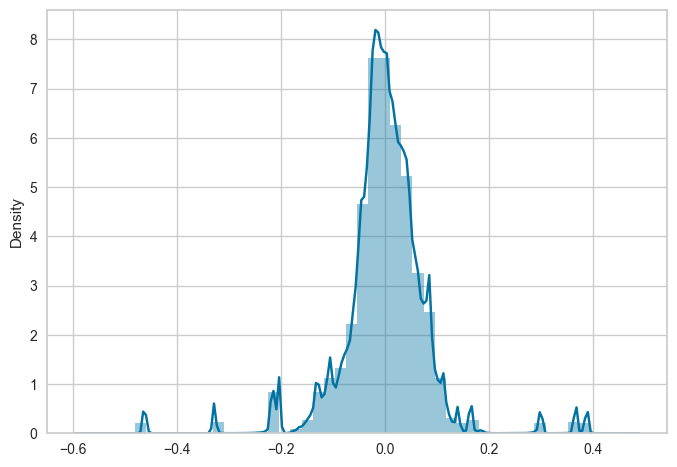

In [7]:
# plot distribution of embedding
sns.distplot(df_embedding)
plt.show()

Outliers



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



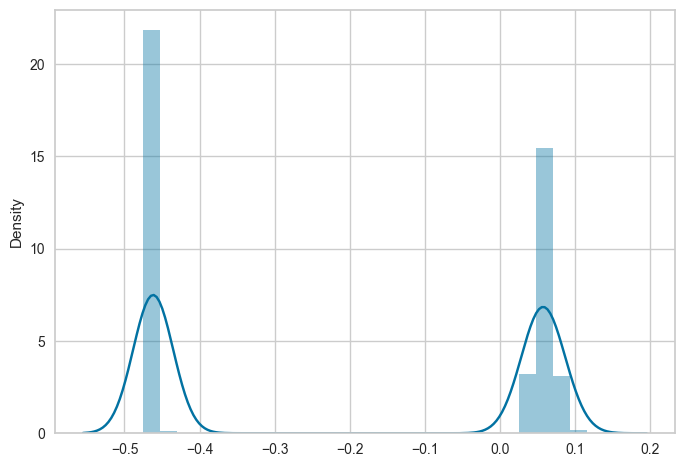

In [8]:
# plot distribution of embedding
sns.distplot(df_embedding[0])
plt.show()

In [9]:
from pyod.models.ecod import ECOD
# https://github.com/yzhao062/pyod

clf = ECOD()
clf.fit(df_embedding)


out = clf.predict(df_embedding) 
df_embedding["outliers"] = out
df["outliers"] = out

df_embedding_no_out = df_embedding[df_embedding["outliers"] == 0]
df_embedding_no_out = df_embedding_no_out.drop(["outliers"], axis = 1)


df_embedding_with_out = df_embedding.copy()
df_embedding_with_out = df_embedding_with_out.drop(["outliers"], axis = 1)

In [10]:
df_no_out = df[df["outliers"] == 0]
df_no_out = df_no_out.drop(["outliers"], axis = 1)
df_no_out

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45205,25,technician,single,secondary,no,505,no,yes,cellular,17,nov,386,2,-1,0,unknown,yes
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [11]:
df_embedding_no_out.shape

(40690, 424)

In [12]:
df_embedding_with_out.shape

(45211, 424)

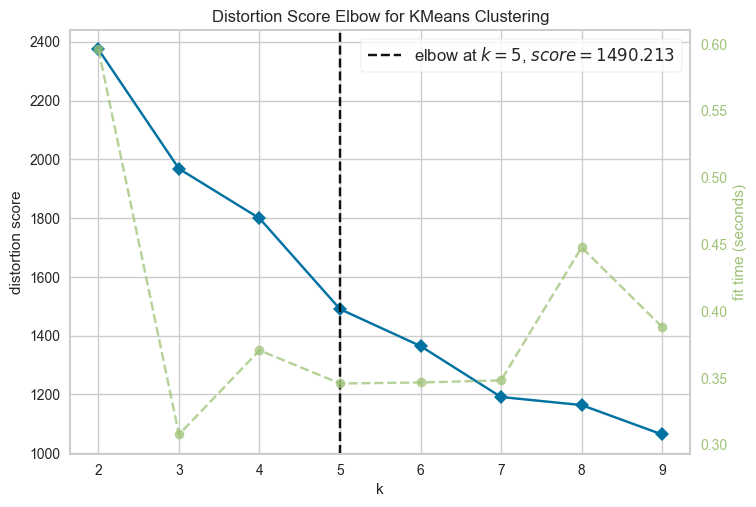

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [13]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10), locate_elbow=True)
 
visualizer.fit(df_embedding_with_out)        # Fit the data to the visualizer
visualizer.show()       

Best Number of Clusters

In [14]:
# def make_Silhouette_plot(X, n_clusters):
#     plt.xlim([-0.1, 1])
#     plt.ylim([0, len(X) + (n_clusters + 1) * 10])
#     clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
#     cluster_labels = clusterer.fit_predict(X)
#     silhouette_avg = silhouette_score(X, cluster_labels)
#     print(
#         "For n_clusters =", n_clusters,
#         "The average silhouette_score is :", silhouette_avg,
#     )
# # Compute the silhouette scores for each sample
#     sample_silhouette_values = silhouette_samples(X, cluster_labels)
#     y_lower = 10
#     for i in range(n_clusters):
#         ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
#         ith_cluster_silhouette_values.sort()
#         size_cluster_i = ith_cluster_silhouette_values.shape[0]
#         y_upper = y_lower + size_cluster_i
#         color = cm.nipy_spectral(float(i) / n_clusters)
#         plt.fill_betweenx(
#             np.arange(y_lower, y_upper),
#             0,
#             ith_cluster_silhouette_values,
#             facecolor=color,
#             edgecolor=color,
#             alpha=0.7,
#         )
#         plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
#         y_lower = y_upper + 10
#         plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
#         plt.xlabel("The silhouette coefficient values", fontsize=24)
#         plt.ylabel("Cluster label", fontsize=24)
#         plt.axvline(x=silhouette_avg, color="red", linestyle="--")
#         plt.yticks([])  
#         plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
    
# range_n_clusters = list(range(2,10))
# for n_clusters in range_n_clusters:
#     print(f"N cluster: {n_clusters}")
#     make_Silhouette_plot(df_embedding_no_out, n_clusters)   
#     plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
#     plt.close()

![Alt text](kpropotype_no_out.png)

The best number is 5-6

Modeling

In [15]:
################# Agglomerative Clustering #################

In [16]:
n_clusters = 4

In [17]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
0,0.070691,-0.024291,0.021448,0.024576,-0.050735,-0.000008,-0.112558,-0.037328,-0.044452,0.009408,...,0.388721,-0.215743,0.085402,0.088088,-0.104152,0.164832,-0.044319,-0.203974,-0.328736,0.300179
0,0.049612,-0.024722,0.024426,0.025298,-0.074871,-0.020314,-0.072445,-0.021263,-0.077605,-0.016649,...,0.388770,-0.215732,0.085407,0.088057,-0.104082,0.164837,-0.044472,-0.203943,-0.328745,0.300234
0,0.041388,-0.037216,0.027541,0.019617,-0.051859,0.023432,-0.100825,-0.028768,-0.058905,0.011837,...,0.388760,-0.215735,0.085406,0.088064,-0.104097,0.164836,-0.044439,-0.203949,-0.328743,0.300222
0,0.070691,-0.024291,0.021448,0.024576,-0.050735,-0.000008,-0.112558,-0.037328,-0.044452,0.009408,...,0.388802,-0.215725,0.085411,0.088038,-0.104037,0.164840,-0.044570,-0.203923,-0.328750,0.300269
0,0.067891,-0.020523,0.020824,0.025024,-0.050414,-0.008134,-0.091215,-0.046520,-0.060289,-0.010729,...,0.388827,-0.215720,0.085413,0.088023,-0.104002,0.164842,-0.044646,-0.203907,-0.328754,0.300296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.047291,-0.008585,0.034971,0.026983,-0.066041,-0.017818,-0.067380,-0.024633,-0.075219,-0.009920,...,0.388837,-0.215717,0.085415,0.088016,-0.103987,0.164843,-0.044679,-0.203900,-0.328756,0.300307
0,0.064341,-0.009464,0.035023,0.021558,-0.065011,-0.007002,-0.096069,-0.023917,-0.050682,0.006712,...,0.388746,-0.215738,0.085405,0.088073,-0.104117,0.164834,-0.044396,-0.203958,-0.328740,0.300207
0,0.064263,0.007266,0.033650,0.033142,-0.044423,0.009526,-0.115068,-0.026501,-0.065680,0.016098,...,0.388671,-0.215754,0.085396,0.088118,-0.104222,0.164827,-0.044167,-0.204006,-0.328728,0.300125
0,0.052894,-0.022410,0.036111,0.021996,-0.049131,0.024782,-0.095854,-0.033078,-0.064431,0.014331,...,0.388725,-0.215743,0.085402,0.088086,-0.104147,0.164832,-0.044330,-0.203972,-0.328737,0.300183


In [25]:
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering

# # Sample a subset of the data
# sample_size = 10000
# data_sample = data_no_outliers.sample(n=sample_size, random_state=42)

# Generate the linkage matrix
Z = linkage(df_embedding_no_out, "ward")



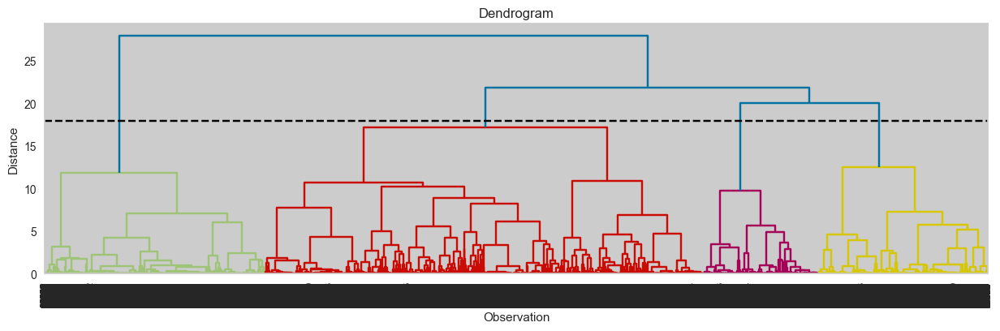

In [26]:
# plot the dendrogram
plt.figure(figsize=(15, 4))
plt.title("Dendrogram")
plt.xlabel("Observation")
plt.ylabel("Distance")
dendrogram(Z, leaf_rotation=90., leaf_font_size=8.)
plt.axhline(y=18, color='black', linestyle='--')
plt.show()

In [27]:
# cut the dendrogram at a distance of 59 and draw a horizontal line
from scipy.cluster.hierarchy import fcluster
max_dist = 18
clusters = fcluster(Z, max_dist, criterion='distance')

# number of unique clusters
n_clusters = len(np.unique(clusters))
n_clusters

4

In [28]:
df_embedding

,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,outliers
0,0.070691,-0.024291,0.021448,0.024576,-0.050735,-0.000008,-0.112558,-0.037328,-0.044452,0.009408,...,-0.215743,0.085402,0.088088,-0.104152,0.164832,-0.044319,-0.203974,-0.328736,0.300179,0
0,0.049612,-0.024722,0.024426,0.025298,-0.074871,-0.020314,-0.072445,-0.021263,-0.077605,-0.016649,...,-0.215732,0.085407,0.088057,-0.104082,0.164837,-0.044472,-0.203943,-0.328745,0.300234,0
0,0.079041,-0.029153,0.007954,0.013947,-0.058003,-0.000688,-0.099988,-0.021615,-0.060375,0.001568,...,-0.215724,0.085411,0.088034,-0.104027,0.164840,-0.044592,-0.203918,-0.328751,0.300276,1
0,0.041388,-0.037216,0.027541,0.019617,-0.051859,0.023432,-0.100825,-0.028768,-0.058905,0.011837,...,-0.215735,0.085406,0.088064,-0.104097,0.164836,-0.044439,-0.203949,-0.328743,0.300222,0
0,0.038729,-0.007158,0.026259,0.043078,-0.036623,-0.012305,-0.082376,-0.029920,-0.064855,-0.016021,...,-0.215724,0.085411,0.088034,-0.104027,0.164840,-0.044592,-0.203918,-0.328751,0.300276,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.064341,-0.009464,0.035023,0.021558,-0.065011,-0.007002,-0.096069,-0.023917,-0.050682,0.006712,...,-0.215738,0.085405,0.088073,-0.104117,0.164834,-0.044396,-0.203958,-0.328740,0.300207,0
0,0.067546,-0.000833,0.035182,0.037752,-0.034829,0.019701,-0.104479,-0.038053,-0.071215,0.011867,...,-0.215754,0.085397,0.088116,-0.104217,0.164828,-0.044178,-0.204003,-0.328728,0.300129,1
0,0.064263,0.007266,0.033650,0.033142,-0.044423,0.009526,-0.115068,-0.026501,-0.065680,0.016098,...,-0.215754,0.085396,0.088118,-0.104222,0.164827,-0.044167,-0.204006,-0.328728,0.300125,0
0,0.052894,-0.022410,0.036111,0.021996,-0.049131,0.024782,-0.095854,-0.033078,-0.064431,0.014331,...,-0.215743,0.085402,0.088086,-0.104147,0.164832,-0.044330,-0.203972,-0.328737,0.300183,0


In [41]:
import plotly.express as px
from sklearn.decomposition import PCA

def get_pca_3d(df, predict):
    assert len(predict) == len(df), "Length of predict does not match length of df"
    
    # Initialize PCA object
    pca = PCA(n_components=3)
    
    # Convert column names to string
    df.columns = df.columns.astype(str)
    
    # Fit and transform the data
    df_pca_3d = pca.fit_transform(df)
    
    # Convert to DataFrame
    df_pca_3d = pd.DataFrame(df_pca_3d, columns=["component-1", "component-2", "component-3"])
    
    # Add cluster labels
    df_pca_3d["cluster"] = predict
    
    return pca, df_pca_3d

# Get PCA results
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out, clusters)

columns = df_pca_3d.columns[0:3].tolist()

# Plot the clusters in 3D using Plotly
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=0.8, width_line = 0.1)
print("The variability is :" + str(pca_3d_object.explained_variance_ratio_))

The variability is :[0.22128116 0.18090558 0.12262375]


In [36]:
def get_pca_2d(df, predict):
    assert len(predict) == len(df), "Length of predict does not match length of df"
    
    # Initialize PCA object
    pca = PCA(n_components=2)
    
    # Fit and transform the data
    df_pca_2d = pca.fit_transform(df)
    
    # Convert to DataFrame
    df_pca_2d = pd.DataFrame(df_pca_2d, columns=["component-1", "component-2"])
    
    # Add cluster labels
    df_pca_2d["cluster"] = predict
    
    return df_pca_2d

df_pca_2d = get_pca_2d(df_embedding_no_out, clusters)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=0.8, width_line = 0.1)

In [43]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding_no_out,clusters)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out,clusters)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out,clusters)}")

Davies bouldin score: 1.508357733945349
Calinski Score: 9487.24491477283
Silhouette Score: 0.3133096866727452


In [46]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=700, 
                  init='random', 
                  perplexity=100, 
                  n_iter = 1000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "PCA Space", opacity=1, width_line = 0.1)

In [47]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


In [48]:
clusters = KMeans(n_clusters=n_clusters, init = "k-means++").fit(df_embedding_no_out)
print(clusters.inertia_)
clusters_predict = clusters.predict(df_embedding_no_out)

C:\Users\Shamika Tissera\AppData\Roaming\Python\Python310\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



1183.7535672318004


Evaluation

In [49]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score

"""
The Davies Bouldin index is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances.
The minimum value of the DB Index is 0, whereas a smaller value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(df_embedding_no_out,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.
Calinski Harabaz Index is defined as the ratio of the sum of between-cluster dispersion and of within-cluster dispersion.
The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(df_embedding_no_out,clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of fit of a clustering algorithm, but can also be used as a method for determining an optimal value of k (see here for more).
Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either the data or the value of k is incorrect.
1 is the ideal value and indicates that clusters are very dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(df_embedding_no_out,clusters_predict)}")

Davies bouldin score: 1.5840499923834437
Calinski Score: 9597.543324984148
Silhouette Score: 0.28809890299803004


In [50]:
df_embedding_no_out

,0,1,2,3,4,5,6,7,8,9,...,30,31,32,33,34,35,36,37,38,39
0,0.070691,-0.024291,0.021448,0.024576,-0.050735,-0.000008,-0.112558,-0.037328,-0.044452,0.009408,...,0.388721,-0.215743,0.085402,0.088088,-0.104152,0.164832,-0.044319,-0.203974,-0.328736,0.300179
0,0.049612,-0.024722,0.024426,0.025298,-0.074871,-0.020314,-0.072445,-0.021263,-0.077605,-0.016649,...,0.388770,-0.215732,0.085407,0.088057,-0.104082,0.164837,-0.044472,-0.203943,-0.328745,0.300234
0,0.041388,-0.037216,0.027541,0.019617,-0.051859,0.023432,-0.100825,-0.028768,-0.058905,0.011837,...,0.388760,-0.215735,0.085406,0.088064,-0.104097,0.164836,-0.044439,-0.203949,-0.328743,0.300222
0,0.070691,-0.024291,0.021448,0.024576,-0.050735,-0.000008,-0.112558,-0.037328,-0.044452,0.009408,...,0.388802,-0.215725,0.085411,0.088038,-0.104037,0.164840,-0.044570,-0.203923,-0.328750,0.300269
0,0.067891,-0.020523,0.020824,0.025024,-0.050414,-0.008134,-0.091215,-0.046520,-0.060289,-0.010729,...,0.388827,-0.215720,0.085413,0.088023,-0.104002,0.164842,-0.044646,-0.203907,-0.328754,0.300296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0.047291,-0.008585,0.034971,0.026983,-0.066041,-0.017818,-0.067380,-0.024633,-0.075219,-0.009920,...,0.388837,-0.215717,0.085415,0.088016,-0.103987,0.164843,-0.044679,-0.203900,-0.328756,0.300307
0,0.064341,-0.009464,0.035023,0.021558,-0.065011,-0.007002,-0.096069,-0.023917,-0.050682,0.006712,...,0.388746,-0.215738,0.085405,0.088073,-0.104117,0.164834,-0.044396,-0.203958,-0.328740,0.300207
0,0.064263,0.007266,0.033650,0.033142,-0.044423,0.009526,-0.115068,-0.026501,-0.065680,0.016098,...,0.388671,-0.215754,0.085396,0.088118,-0.104222,0.164827,-0.044167,-0.204006,-0.328728,0.300125
0,0.052894,-0.022410,0.036111,0.021996,-0.049131,0.024782,-0.095854,-0.033078,-0.064431,0.014331,...,0.388725,-0.215743,0.085402,0.088086,-0.104147,0.164832,-0.044330,-0.203972,-0.328737,0.300183


In [51]:
len(np.unique(clusters_predict))

4

In [52]:
pca_3d_object, df_pca_3d = get_pca_3d(df_embedding_no_out, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=0.8, width_line = 0.1)



![Alt text](img/embedding1.png)

In [53]:
pca_2d_object, df_pca_2d = get_pca_2d(df_embedding_no_out, clusters_predict)
plot_pca_2d(df_pca_2d, title = "PCA Space", opacity=1, width_line = 0.2)


ValueError: too many values to unpack (expected 2)

![Alt text](img/embedding2.png)

t-SNE   3D

In [ ]:
sampling_data = df_embedding_no_out.sample(frac=0.5, replace=True, random_state=1)
sampling_clusters = pd.DataFrame(clusters_predict).sample(frac=0.5, replace=True, random_state=1)[0].values

df_tsne_3d = TSNE(
                  n_components=3, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_3d = pd.DataFrame(df_tsne_3d, columns=["comp1", "comp2",'comp3'])
df_tsne_3d["cluster"] = sampling_clusters
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=1, width_line = 0.1)


KeyboardInterrupt: 

![Alt text](img/embedding3.png)

In [ ]:
plot_pca_3d(df_tsne_3d, title = "T-SNE Space", opacity=0.1, width_line = 0.1)

t-SNE 2D

In [ ]:
df_tsne_2d = TSNE(
                  n_components=2, 
                  learning_rate=500, 
                  init='random', 
                  perplexity=200, 
                  n_iter = 5000).fit_transform(sampling_data)

df_tsne_2d = pd.DataFrame(df_tsne_2d, columns=["comp1", "comp2"])
df_tsne_2d["cluster"] = sampling_clusters

plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=0.5, width_line = 0.5)


![Alt text](img/embedding4.png)

In [ ]:
plot_pca_2d(df_tsne_2d, title = "PCA Space", opacity=1, width_line = 0.5)


<h1> Explanations </h1>

In [ ]:
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y,outliers
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,0
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,0
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,1
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no,0
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes,0
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes,0
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes,0
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no,0


In [ ]:
df_no_outliers = df[df["outliers"] == 0]
df_no_outliers = df_no_outliers.drop("outliers", axis = 1)

In [ ]:
clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)

for col in ["job", "marital", "education", "housing", "loan", "default"]:
    df_no_outliers[col] = df_no_outliers[col].astype('category')

clf_km.fit(X = df_no_outliers , y = clusters_predict)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(df_no_outliers)
shap.summary_plot(shap_values_km, df_no_outliers, plot_type="bar", plot_size=(15, 10))

ValueError: pandas dtypes must be int, float or bool.
Fields with bad pandas dtypes: contact: object, month: object, poutcome: object, y: object

In [ ]:
y_pred = clf_km.predict(df_no_outliers)
accuracy=accuracy_score(y_pred, clusters_predict)
print('Training-set accuracy score: {0:0.4f}'. format(accuracy))
print(classification_report(clusters_predict, y_pred))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree
Training-set accuracy score: 1.0000
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5274
           1       1.00      1.00      1.00      2172
           2       1.00      1.00      1.00      1896
           3       1.00      1.00      1.00      2939
           4       1.00      1.00      1.00      5719

    accuracy                           1.00     18000
   macro avg       1.00      1.00      1.00     18000
weighted avg       1.00      1.00      1.00     18000



Cluster Info

In [ ]:
df_no_outliers

NameError: name 'df_no_outliers' is not defined

In [ ]:
df_no_outliers = df_no_out

In [ ]:
df_no_outliers["cluster"] = clusters_predict

df_group = df_no_outliers.groupby('cluster').agg(
    {
        'job': lambda x: x.value_counts().index[0],
        'marital': lambda x: x.value_counts().index[0],
        'education': lambda x: x.value_counts().index[0],
        'housing': lambda x: x.value_counts().index[0],
        'loan': lambda x: x.value_counts().index[0],
        'age':'mean',
        'balance': 'mean',
        'default': lambda x: x.value_counts().index[0],
        
    }
).sort_values("job").reset_index()
df_group

,cluster,job,marital,education,housing,loan,age,balance,default
0,2,blue-collar,married,secondary,yes,no,40.146167,1082.506213,no
1,1,management,single,secondary,yes,no,34.081613,1285.718217,no
2,3,management,married,tertiary,no,no,45.302580,1589.745713,no
3,0,technician,married,secondary,yes,no,41.822288,1205.822905,no
